In [1]:
import s3fs
import os
import pandas as pd
import tifffile
from matplotlib import pyplot as plt
import numpy as np
import h5py
from scipy.spatial.transform import Rotation as R

# Set1

In [2]:
detectedTranscripts = pd.read_csv("data/MERFISH/set1/barcodes.csv")
codebook = pd.read_csv("data/MERFISH/set1/VZG142_codebook.csv")

In [3]:
detectedTranscripts['gene'] = None

for i, r in codebook.iterrows():
    detectedTranscripts.loc[detectedTranscripts['barcode_id']== i, 'gene'] = r['name']

In [4]:
OR_genes = ["Olfr273","Olfr417"]

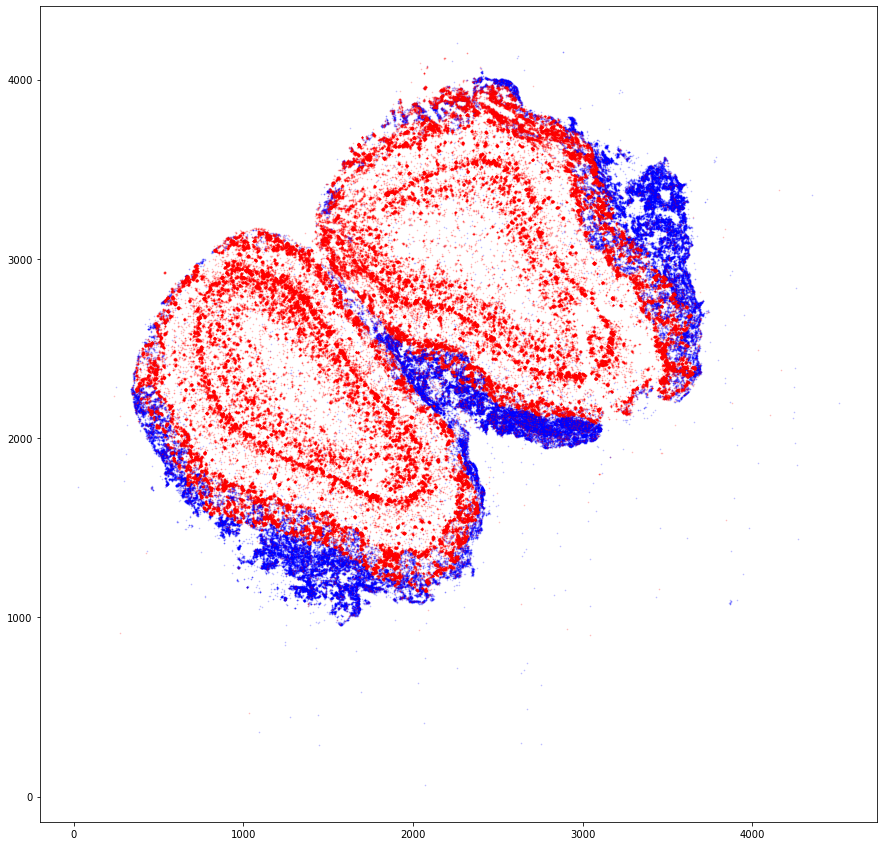

In [5]:
extent = np.min(detectedTranscripts['global_x']), np.max(detectedTranscripts['global_x']), np.min(detectedTranscripts['global_y']), np.max(detectedTranscripts['global_y'])

fig = plt.figure(frameon=False, figsize=(15,15))
geneNames = []
geneName='Omp'
plt.scatter(detectedTranscripts[detectedTranscripts['gene']==geneName]['global_x'],
           detectedTranscripts[detectedTranscripts['gene']==geneName]['global_y'],color='b',s=0.5, alpha=0.2)
geneName='Calb2'
plt.scatter(detectedTranscripts[detectedTranscripts['gene']==geneName]['global_x'],
           detectedTranscripts[detectedTranscripts['gene']==geneName]['global_y'],color='r',s=0.5, alpha=0.2)
plt.show()

In [6]:
detectedTranscripts["dummy_z"] = 0
r = R.from_euler("Z", -40, degrees=True)
coords = detectedTranscripts[["global_x", "global_y", "dummy_z"]].values
detectedTranscripts[["new_X", "new_Y", "new_Z"]] = r.apply(coords)

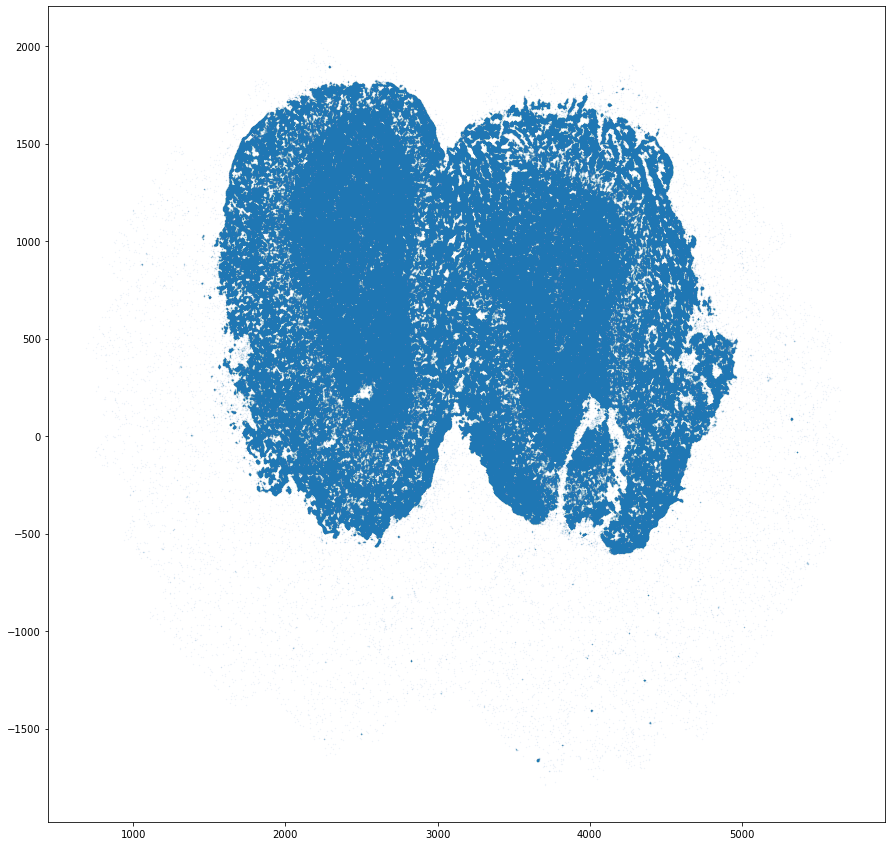

In [7]:
plt.figure(figsize=(15,15))
plt.scatter(detectedTranscripts['new_X'], detectedTranscripts['new_Y'], s=0.1, alpha=0.1)

In [8]:
detectedTranscripts2 = detectedTranscripts[(detectedTranscripts["new_X"]>1500) &
                                         (detectedTranscripts["new_X"]<5000) &
                                          (detectedTranscripts["new_Y"]<1900) &
                                          (detectedTranscripts["new_Y"]>-600)]

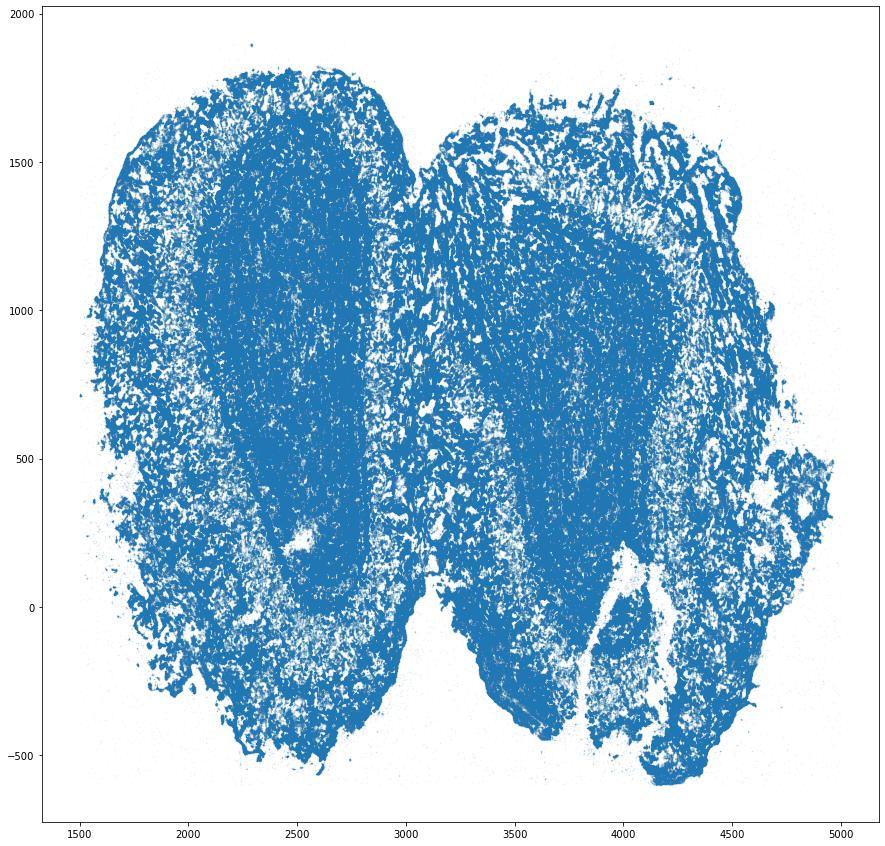

In [9]:
plt.figure(figsize=(15,15))
plt.scatter(detectedTranscripts2['new_X'], detectedTranscripts2['new_Y'], s=0.1, alpha=0.1)

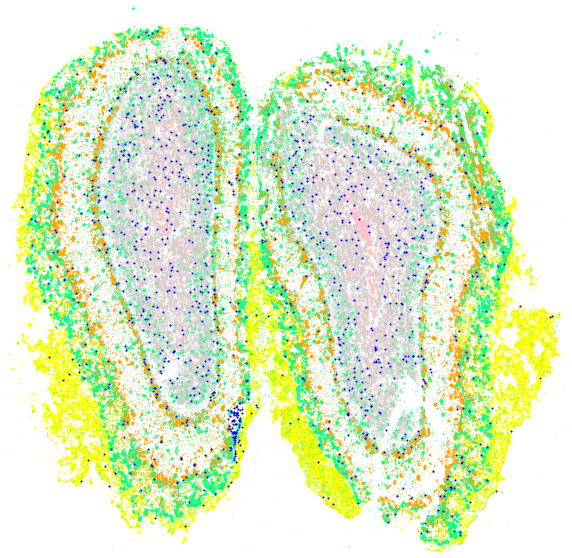

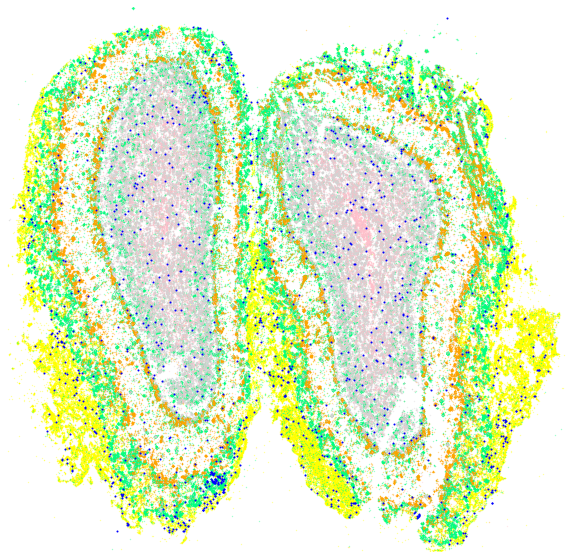

In [18]:
for i in OR_genes:
    extent = np.min(detectedTranscripts2['new_X']), np.max(detectedTranscripts2['new_X']), np.min(detectedTranscripts2['new_Y']), np.max(detectedTranscripts2['new_Y'])
    fig = plt.figure(frameon=True, figsize=(10,10), facecolor='white')
    ax = fig.add_subplot(1, 1, 1)
    ax.set_facecolor('white')
    ax.axis('off')
    plt.xlim([np.min(detectedTranscripts2['new_X']), np.max(detectedTranscripts2['new_X'])])
    plt.ylim([np.min(detectedTranscripts2['new_Y']), np.max(detectedTranscripts2['new_Y'])])
    geneName='Omp'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='yellow',s=0.1, alpha=0.5)
    geneName='Calb2'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='springgreen',s=0.1, alpha=0.5)
    geneName='Cdhr1'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='orange',s=0.1, alpha=0.5)
    geneName='Penk'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='lightgray',s=0.1, alpha=0.5)
    geneName='Sox11'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='pink',s=0.1, alpha=0.5)
    geneName= i
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='blue',s=1, alpha=1)
    #plt.show()
    plt.savefig('MERFISH_'+geneName+'.jpeg', dpi = 300)

# Set2

In [106]:
detectedTranscripts = pd.read_csv("data/MERFISH/set2/barcodes.csv")

In [107]:
detectedTranscripts['gene'] = None

for i, r in codebook.iterrows():
    detectedTranscripts.loc[detectedTranscripts['barcode_id']== i, 'gene'] = r['name']

In [108]:
OR_genes = ["Olfr24","Olfr1494","Olfr129","Olfr1222"]

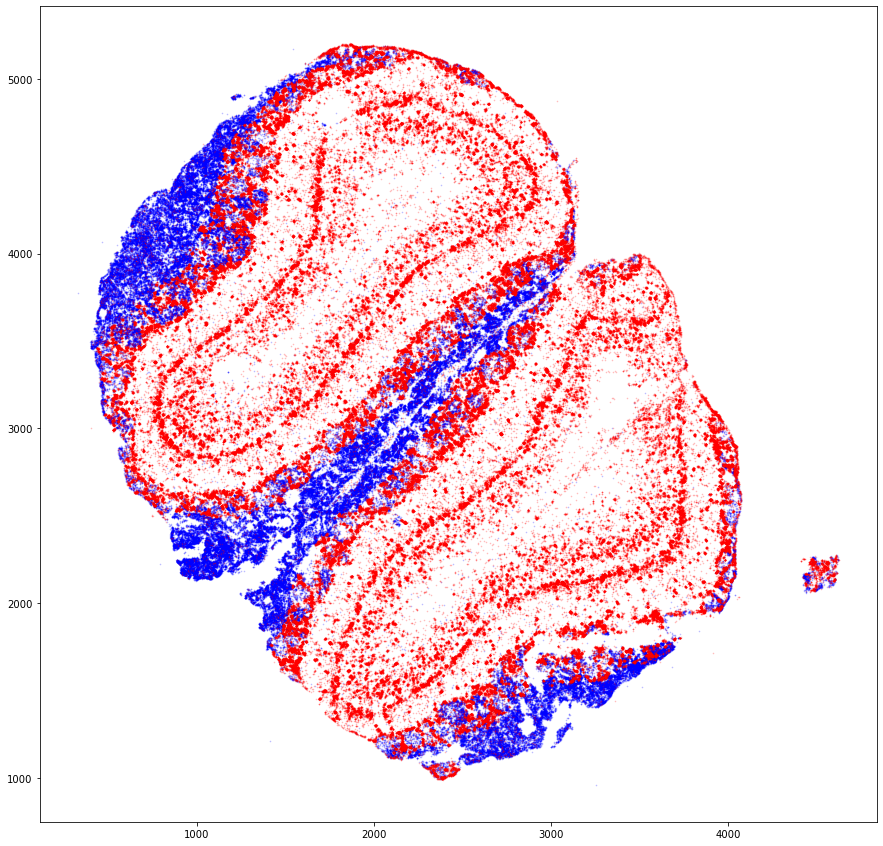

In [109]:
extent = np.min(detectedTranscripts['global_x']), np.max(detectedTranscripts['global_x']), np.min(detectedTranscripts['global_y']), np.max(detectedTranscripts['global_y'])

fig = plt.figure(frameon=False, figsize=(15,15))
geneNames = []
geneName='Omp'
plt.scatter(detectedTranscripts[detectedTranscripts['gene']==geneName]['global_x'],
           detectedTranscripts[detectedTranscripts['gene']==geneName]['global_y'],color='b',s=0.5, alpha=0.2)
geneName='Calb2'
plt.scatter(detectedTranscripts[detectedTranscripts['gene']==geneName]['global_x'],
           detectedTranscripts[detectedTranscripts['gene']==geneName]['global_y'],color='r',s=0.5, alpha=0.2)
plt.show()

In [110]:
detectedTranscripts["dummy_z"] = 0
r = R.from_euler("Z", 40, degrees=True)
coords = detectedTranscripts[["global_x", "global_y", "dummy_z"]].values
detectedTranscripts[["new_X", "new_Y", "new_Z"]] = r.apply(coords)

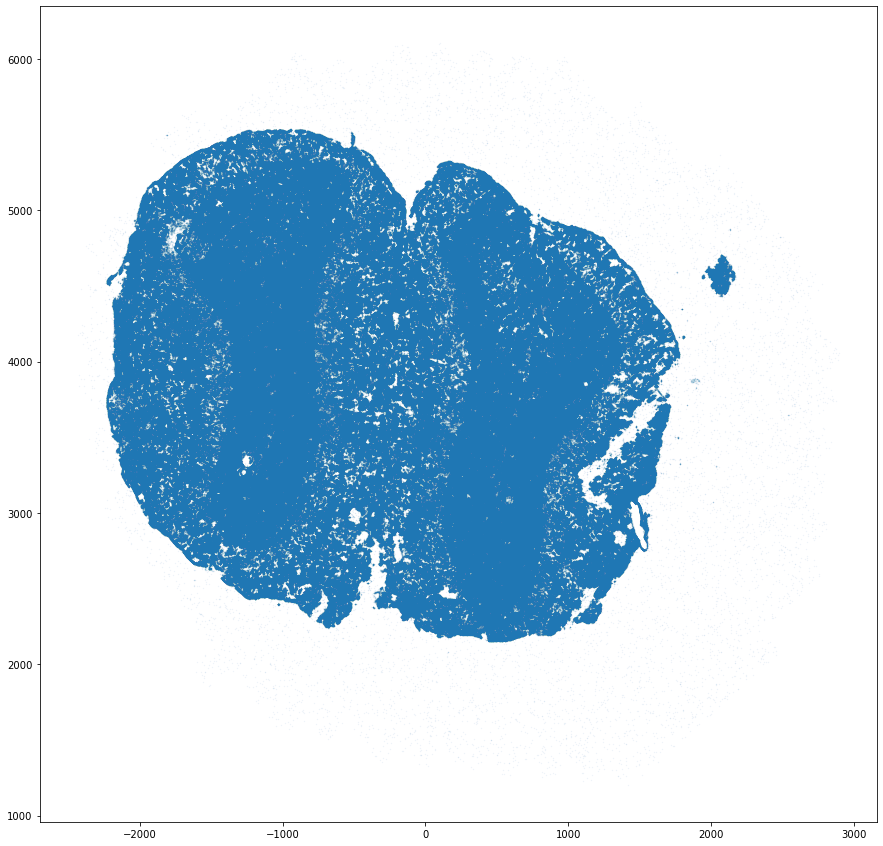

In [111]:
plt.figure(figsize=(15,15))
plt.scatter(detectedTranscripts['new_X'], detectedTranscripts['new_Y'], s=0.1, alpha=0.1)

In [112]:
detectedTranscripts2 = detectedTranscripts[(detectedTranscripts["new_X"]>-2300) &
                                         (detectedTranscripts["new_X"]<1800) &
                                          (detectedTranscripts["new_Y"]<5700) &
                                          (detectedTranscripts["new_Y"]>2100)]

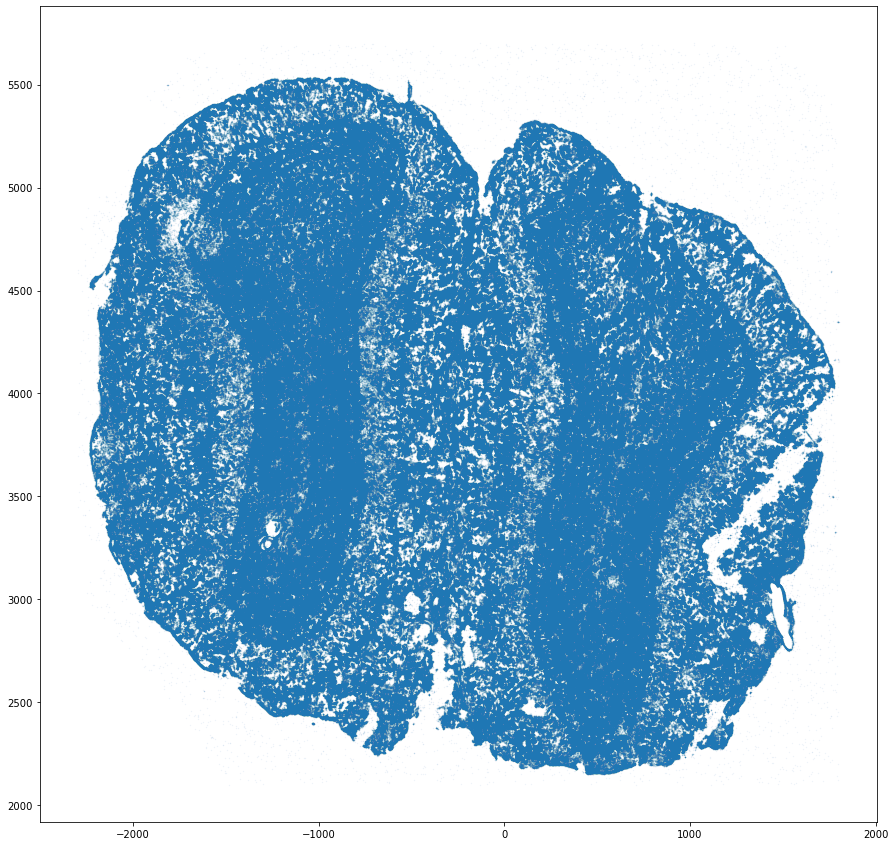

In [113]:
plt.figure(figsize=(15,15))
plt.scatter(detectedTranscripts2['new_X'], detectedTranscripts2['new_Y'], s=0.1, alpha=0.1)

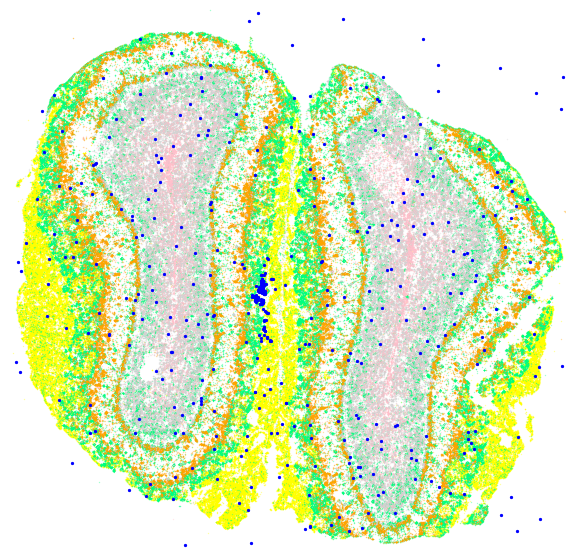

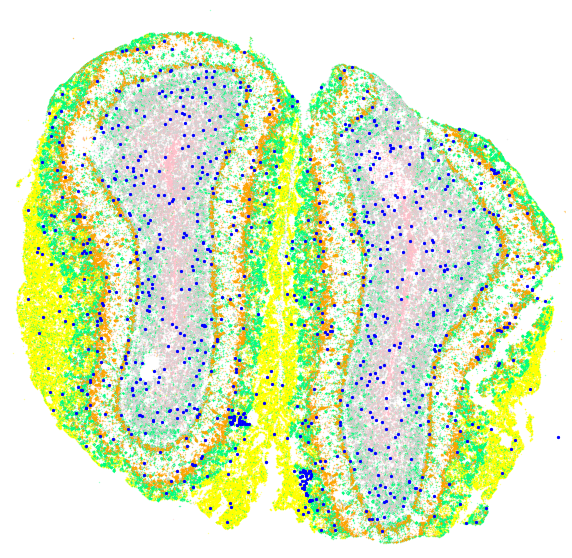

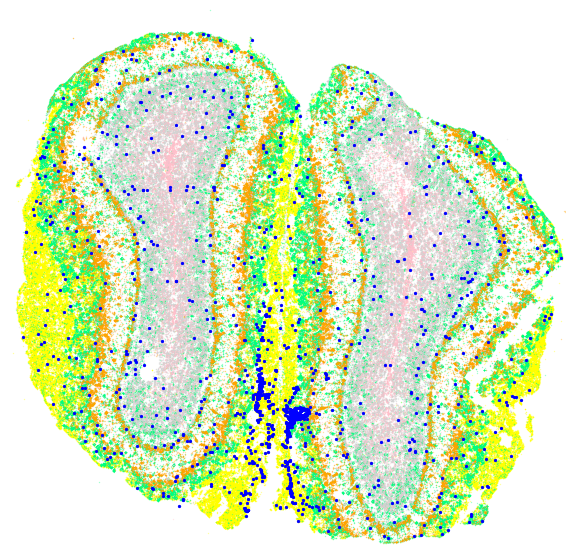

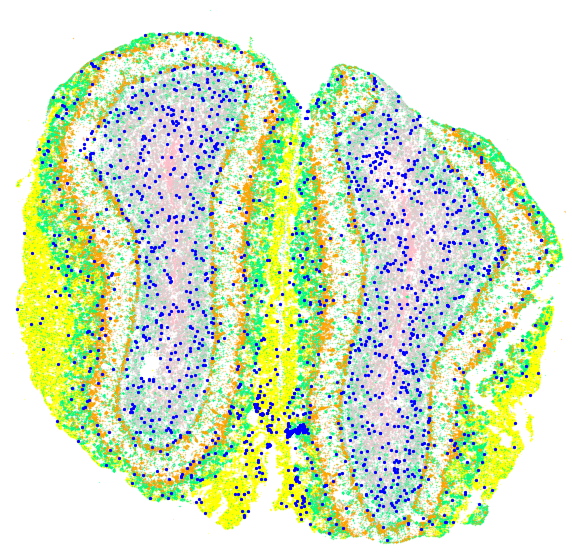

In [114]:
for i in OR_genes:
    extent = np.min(detectedTranscripts2['new_X']), np.max(detectedTranscripts2['new_X']), np.min(detectedTranscripts2['new_Y']), np.max(detectedTranscripts2['new_Y'])
    fig = plt.figure(frameon=True, figsize=(10,10), facecolor='white')
    ax = fig.add_subplot(1, 1, 1)
    ax.set_facecolor('white')
    ax.axis('off')
    plt.xlim([np.min(detectedTranscripts2['new_X']), np.max(detectedTranscripts2['new_X'])])
    plt.ylim([np.min(detectedTranscripts2['new_Y']), np.max(detectedTranscripts2['new_Y'])])
    geneName='Omp'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='yellow',s=0.1, alpha=0.5)
    geneName='Calb2'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='springgreen',s=0.1, alpha=0.5)
    geneName='Cdhr1'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='orange',s=0.1, alpha=0.5)
    geneName='Penk'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='lightgray',s=0.1, alpha=0.5)
    geneName='Sox11'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='pink',s=0.1, alpha=0.5)
    geneName= i
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='blue',s=5, alpha=1)
    #plt.show()
    plt.savefig('plots/MERFISH_'+geneName+'.jpeg', dpi = 300)

# Set3

In [115]:
detectedTranscripts = pd.read_csv("data/MERFISH/set3/barcodes.csv")

In [116]:
detectedTranscripts['gene'] = None

for i, r in codebook.iterrows():
    detectedTranscripts.loc[detectedTranscripts['barcode_id']== i, 'gene'] = r['name']

In [117]:
OR_genes = ["Olfr12","Olfr124","Olfr1226","Olfr136","Olfr60","Olfr1211"]

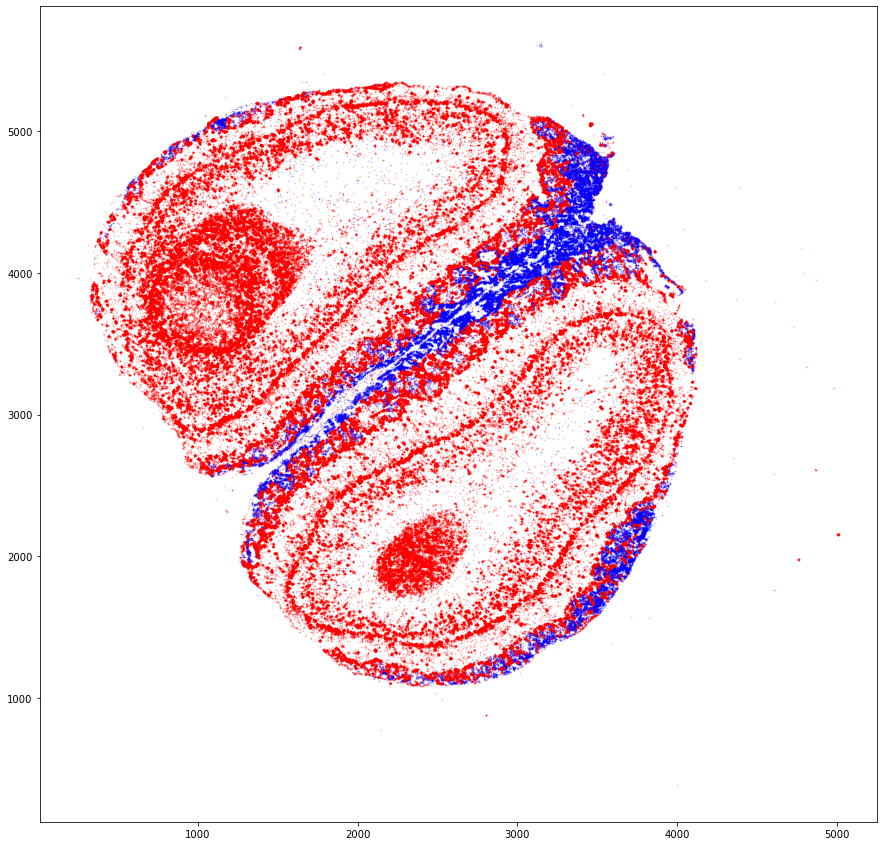

In [118]:
extent = np.min(detectedTranscripts['global_x']), np.max(detectedTranscripts['global_x']), np.min(detectedTranscripts['global_y']), np.max(detectedTranscripts['global_y'])

fig = plt.figure(frameon=False, figsize=(15,15))
geneNames = []
geneName='Omp'
plt.scatter(detectedTranscripts[detectedTranscripts['gene']==geneName]['global_x'],
           detectedTranscripts[detectedTranscripts['gene']==geneName]['global_y'],color='b',s=0.5, alpha=0.2)
geneName='Calb2'
plt.scatter(detectedTranscripts[detectedTranscripts['gene']==geneName]['global_x'],
           detectedTranscripts[detectedTranscripts['gene']==geneName]['global_y'],color='r',s=0.5, alpha=0.2)
plt.show()

In [119]:
detectedTranscripts["dummy_z"] = 0
r = R.from_euler("Z", -135, degrees=True)
coords = detectedTranscripts[["global_x", "global_y", "dummy_z"]].values
detectedTranscripts[["new_X", "new_Y", "new_Z"]] = r.apply(coords)

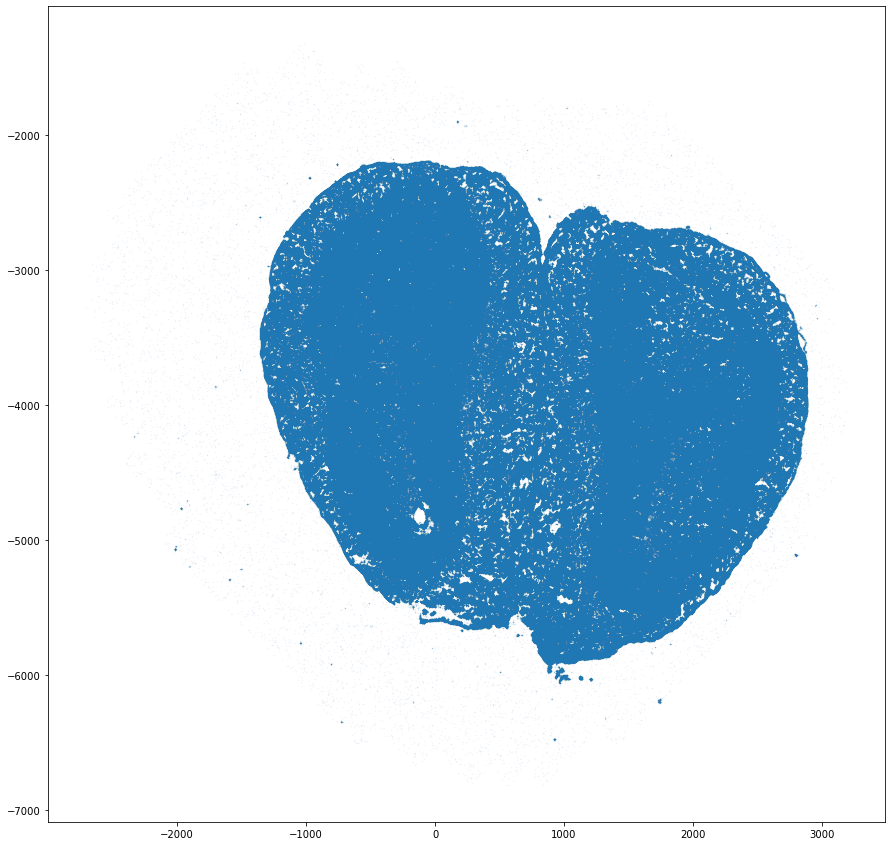

In [120]:
plt.figure(figsize=(15,15))
plt.scatter(detectedTranscripts['new_X'], detectedTranscripts['new_Y'], s=0.1, alpha=0.1)

In [121]:
detectedTranscripts2 = detectedTranscripts[(detectedTranscripts["new_X"]>-1500) &
                                         (detectedTranscripts["new_X"]<3000) &
                                          (detectedTranscripts["new_Y"]<-2000) &
                                          (detectedTranscripts["new_Y"]>-6000)]

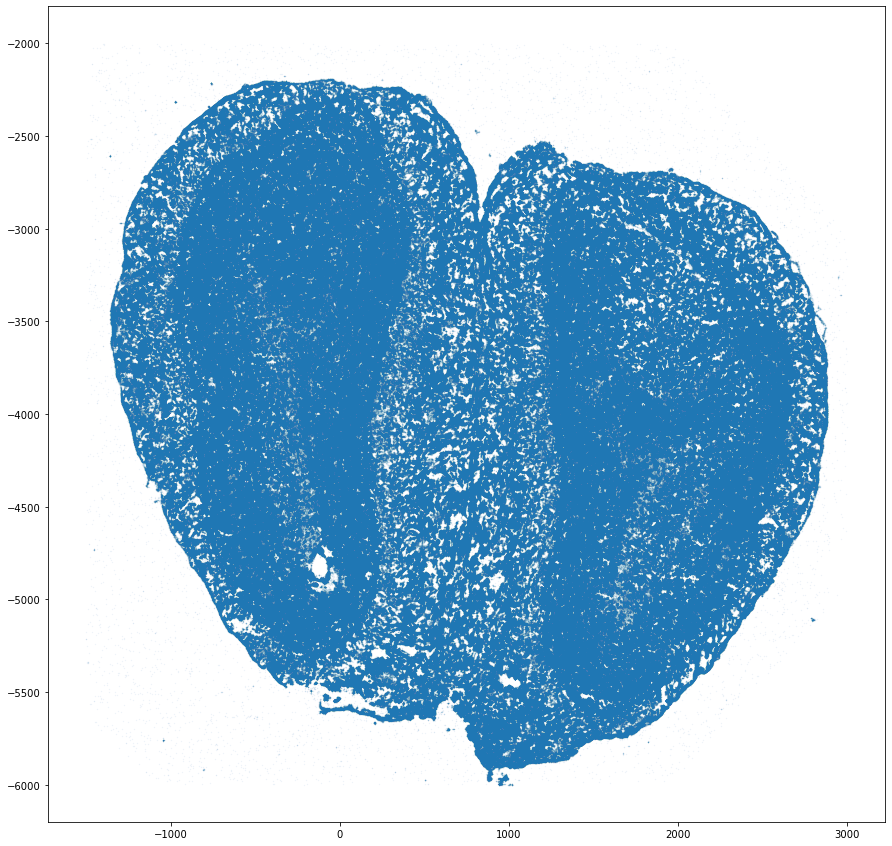

In [122]:
plt.figure(figsize=(15,15))
plt.scatter(detectedTranscripts2['new_X'], detectedTranscripts2['new_Y'], s=0.1, alpha=0.1)

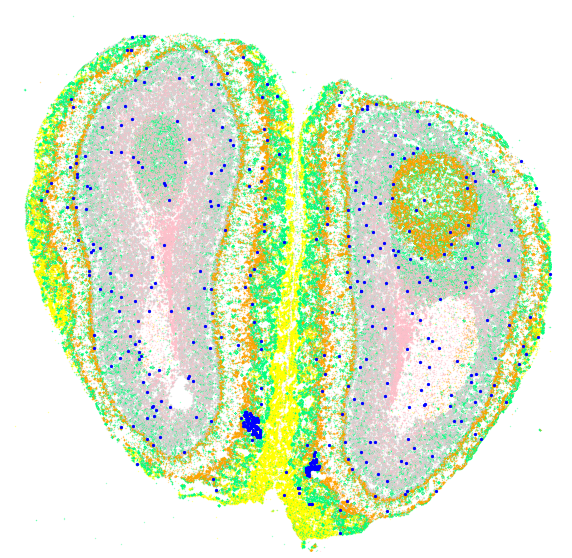

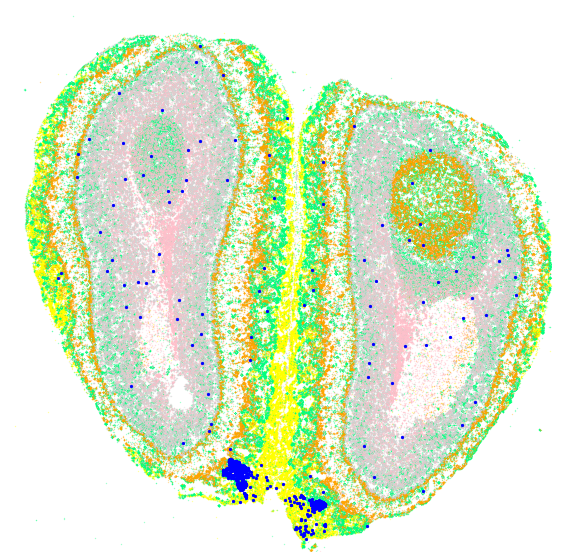

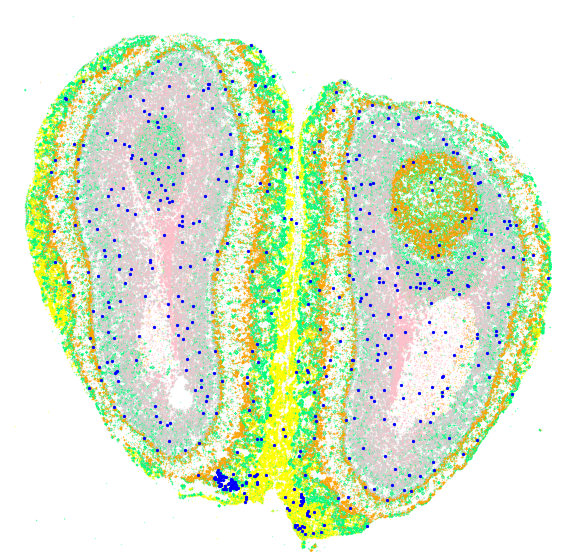

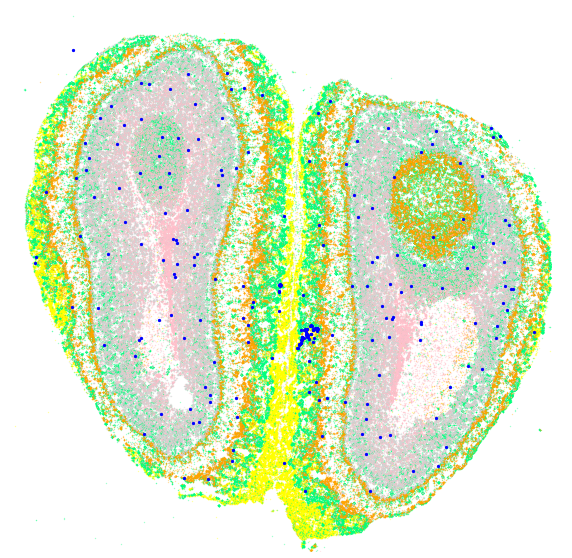

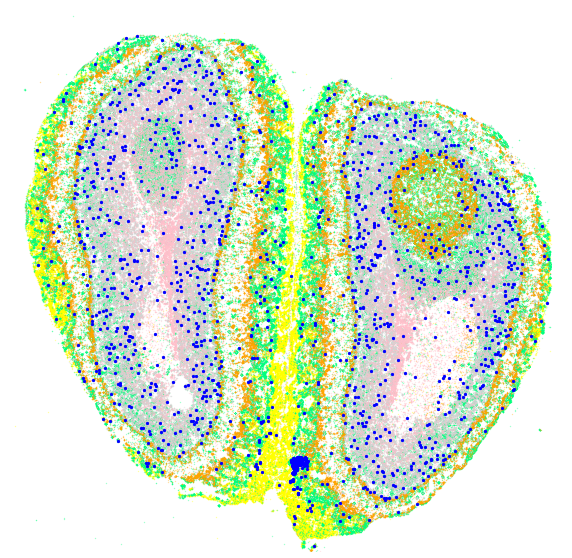

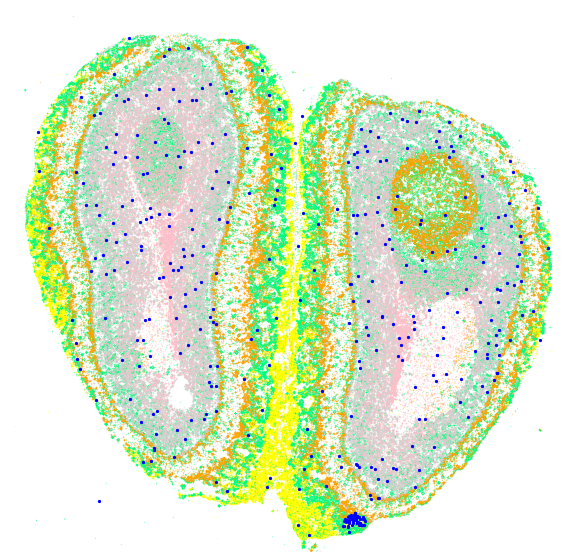

In [123]:
for i in OR_genes:
    extent = np.min(detectedTranscripts2['new_X']), np.max(detectedTranscripts2['new_X']), np.min(detectedTranscripts2['new_Y']), np.max(detectedTranscripts2['new_Y'])
    fig = plt.figure(frameon=True, figsize=(10,10), facecolor='white')
    ax = fig.add_subplot(1, 1, 1)
    ax.set_facecolor('white')
    ax.axis('off')
    plt.xlim([np.min(detectedTranscripts2['new_X']), np.max(detectedTranscripts2['new_X'])])
    plt.ylim([np.min(detectedTranscripts2['new_Y']), np.max(detectedTranscripts2['new_Y'])])
    geneName='Omp'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='yellow',s=0.1, alpha=0.5)
    geneName='Calb2'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='springgreen',s=0.1, alpha=0.5)
    geneName='Cdhr1'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='orange',s=0.1, alpha=0.5)
    geneName='Penk'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='lightgray',s=0.1, alpha=0.5)
    geneName='Sox11'
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='pink',s=0.1, alpha=0.5)
    geneName= i
    plt.scatter(detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_X'],detectedTranscripts2[detectedTranscripts2['gene']==geneName]['new_Y'],color='blue',s=5, alpha=1)
    #plt.show()
    plt.savefig('plots/MERFISH_'+geneName+'.jpeg', dpi = 300)